In [2]:
!pip install -U kaleido

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 19.9 MB/s eta 0:00:00


In [3]:
!pip install pydrive  # Install PyDrive library

In [4]:
pip install mpld3

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 201.2/201.2 kB 3.8 MB/s eta 0:00:00


In [5]:
pip install plotly

In [6]:
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
# Code to read csv file into colaboratory:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import TruncatedSVD
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import silhouette_score
import mpld3
from mpl_toolkits.axes_grid1 import make_axes_locatable
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.io as pio

In [7]:
#STEP-2: Autheticate E-Mail ID

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [8]:
#mondo_terms.csv = https://drive.google.com/file/d/1vyvXH8ZHYix74aoxrLpqmeRDSrSy-Dgg/view?usp=drive_link
downloaded = drive.CreateFile({'id':'1vyvXH8ZHYix74aoxrLpqmeRDSrSy-Dgg'}) # replace the id with id of file you want to access
downloaded.GetContentFile('mondo_terms.csv')

#orphanet.csv = https://drive.google.com/file/d/1bVQQl-tBfjskWVZ7EdkduoDezDGL1XLb/view?usp=drive_link
downloaded = drive.CreateFile({'id':'1bVQQl-tBfjskWVZ7EdkduoDezDGL1XLb'}) # replace the id with id of file you want to access
downloaded.GetContentFile('orphanet.csv')

#umls.csv = https://drive.google.com/file/d/17cvrG3EhKcBitnFDLOcu8Lj0paQ4nR2f/view?usp=drive_link
downloaded = drive.CreateFile({'id':'17cvrG3EhKcBitnFDLOcu8Lj0paQ4nR2f'}) # replace the id with id of file you want to access
downloaded.GetContentFile('umls.csv')

#kg_grouped_disease.csv = https://drive.google.com/file/d/1BNW53cAwg5_93-5ETWhA2LCcegAEKsuu/view?usp=drive_link
downloaded = drive.CreateFile({'id':'1BNW53cAwg5_93-5ETWhA2LCcegAEKsuu'}) # replace the id with id of file you want to access
downloaded.GetContentFile('kg_grouped_disease.csv')

 #kg.csv = https://drive.google.com/file/d/1-64Njx-iIXBebF2jMTeumjhH-0YDdJLn/view?usp=sharing
downloaded = drive.CreateFile({'id':'1-64Njx-iIXBebF2jMTeumjhH-0YDdJLn'}) # replace the id with id of file you want to access
downloaded.GetContentFile('kg.csv')

#disease_features.csv = https://drive.google.com/file/d/1mTiQouVDTiWnFTzx7NByxOvmc8fSUp8I/view?usp=drive_link
downloaded = drive.CreateFile({'id':'1mTiQouVDTiWnFTzx7NByxOvmc8fSUp8I'}) # replace the id with id of file you want to access
downloaded.GetContentFile('disease_features.csv')

#drug_features.csv = https://drive.google.com/file/d/1gNCE5Bgz9UaPKkjxYxG8YGYD3VNJ-37q/view?usp=drive_link
downloaded = drive.CreateFile({'id':'1gNCE5Bgz9UaPKkjxYxG8YGYD3VNJ-37q'}) # replace the id with id of file you want to access
downloaded.GetContentFile('drug_features.csv')

#kg_giant.csv = https://drive.google.com/file/d/1Xx5LYjDzfU0-GuyGhqici3BlJLRIxCDR/view?usp=drive_link
downloaded = drive.CreateFile({'id':'1Xx5LYjDzfU0-GuyGhqici3BlJLRIxCDR'}) # replace the id with id of file you want to access
downloaded.GetContentFile('kg_giant.csv')

#BP_genes = https://docs.google.com/spreadsheets/d/1H84Sp6FoX0AIwADydIaWATSlD3wTE712/edit?usp=sharing&ouid=117088395176722359704&rtpof=true&sd=true
downloaded = drive.CreateFile({'id':'1H84Sp6FoX0AIwADydIaWATSlD3wTE712'}) # replace the id with id of file you want to access
downloaded.GetContentFile('BP_genes.xlsx')

In [9]:
BP_genes = pd.read_excel('./BP_genes.xlsx')
BP_genes.head(12)

,Loci,Gene,RFR_Score,Training_Score,LocusGene(s),AvgScore_Per_Locus,SD_Per_Locus,Upper_SD_Threshold,direct_PPI_count,secondary_PPI_count,...,Source,Type,CP_LEADSNP,CPs,minTRAIT,min_pvalue,GPrior_Score,ToppGene_Score,Mantis_probability,GTEx_signif_sexbias
0,1,CLNS1A,0.682311,NaN,"AQP11, CLNS1A, RSF1, Y_RNA",0.472007,0.269445,0.741452,1,357,...,"NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA...","NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA...","11:77301341, 11:77359909, 11:77378388, 11:7758...","11:77245728, 11:77245947, 11:77250912, 11:7725...",DBP,0.0,0.492653,0.250818,0.148011,1
1,2,SNTG1,0.599031,NaN,"RP11-139G7.1, SNTG1",0.362879,0.333969,0.696848,0,86,...,"NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA...","NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA...","8:51720126, 8:51720126, 8:51720126, 8:51720126...","8:51570940, 8:51572438, 8:51572756, 8:51572757...",SBP,0.0,0.538142,0.348072,0.046035,NaN
2,3,FOLH1,0.724607,NaN,"CTD-2026G22.1, CTD-2132H18.3, FOLH1, OR4A41P, ...",0.160742,0.121245,0.281987,0,46,...,"NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA...","NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA...","11:48923756, 11:48923756, 11:48923756, 11:4892...","11:49164368, 11:49164594, 11:49165240, 11:4916...",SBP,0.0,0.471048,0.487182,0.749654,NaN
3,4,RSF1,0.689905,NaN,"AAMDC, GAB2, INTS4, RSF1, USP35",0.482307,0.129574,0.611881,0,138,...,"NA, NA, NA, NA, NA, NA, NA, NA, NA, BPICE_Exom...","NA, NA, NA, NA, NA, NA, NA, NA, NA, Lead, NA, ...","11:77301341, 11:77359909, 11:77378388, 11:7758...","11:77370758, 11:77370897, 11:77371494, 11:7737...",DBP,0.0,0.484522,0.334334,0.128444,NaN
4,5,CFDP1,0.426064,NaN,"CFDP1, CHST6, RP11-77K12.1, TMEM170A",0.266923,0.114067,0.38099,0,67,...,"NA, NA, BPICE_UKBfinemapCommon(1210), NA, NA, ...","NA, NA, Secondary, NA, NA, Lead, NA, NA, NA, N...","16:75314838, 16:75328591, 16:75443183, 16:7544...","16:75325933, 16:75326346, 16:75328591, 16:7532...","PP,SBP",0.0,0.461355,0.359336,0.662329,1
5,6,SMARCC1,0.784545,NaN,"CSPG5, SMARCC1",0.753921,0.04331,0.79723,1,836,...,"NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA...","NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA...","3:47927484, 3:47927484, 3:47927484, 3:47927484...","3:47626782, 3:47633355, 3:47633759, 3:47634682...",DBP,0.0,0.501415,0.365112,0.21755,NaN
6,7,PTK2,0.800279,NaN,PTK2,0.800279,NaN,NaN,7,2065,...,"NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA...","NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA...","8:141858620, 8:141887269, 8:141938139, 8:14185...","8:141706117, 8:141709868, 8:141711951, 8:14171...","SBP, DBP",0.0,0.50622,0.611044,0.729619,1
7,8,UBE2E3,0.667595,NaN,UBE2E3,0.667595,NaN,NaN,2,287,...,"NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA...","NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA...","2:181946115, 2:181946115, 2:181946115, 2:18194...","2:181828140, 2:181829033, 2:181829035, 2:18182...",DBP,0.0,0.478996,0.239494,0.394407,1
8,9,XPO1,0.775991,NaN,"AC016727.3, AHSA2, RP11-355B11.1, RP11-355B11....",0.332996,0.235536,0.568532,7,1000,...,"NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA...","NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA...","2:61772257, 2:61836235, 2:61772257, 2:61836235...","2:61707438, 2:61709349, 2:61709747, 2:61713526...",DBP,0.0,0.495695,0.431492,0.358964,1
9,10,USP38,0.352986,NaN,"RP11-284M14.1, USP38",0.24762,0.149011,0.39663,0,6,...,"NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA...","NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA...","4:144168650, 4:144168650, 4:144168650, 4:14416...","4:144107822, 4:144108161, 4:144108641, 4:14410...","DBP,SBP",0.0,0.432524,0.292403,0.134952,NaN


In [10]:
BP_genes['Gene'].unique()

array(['CLNS1A', 'SNTG1', 'FOLH1', 'RSF1', 'CFDP1', 'SMARCC1', 'PTK2',
       'UBE2E3', 'XPO1', 'USP38', 'COL4A4', 'SLC4A10', 'UFL1', 'BTBD1',
       'STEAP2', 'MAK16', 'RABGAP1', 'KDM5A', 'PIAS1', 'OLA1', 'PPP2R5E',
       'LHFPL2', 'SRSF4', 'UNC5C', 'DIRC1', 'SIK2', 'TRIM13', 'NDRG4',
       'MCRS1', 'CYP11B1', 'OR5D14', 'LPXN', 'BANP', 'ODF2', 'PRICKLE1',
       'AUTS2', 'TRPC4AP', 'BCKDHB', 'STK39', 'XPR1', 'ASPN', 'CCNT2',
       'JMJD1C', 'COL8A1', 'COG5', 'TRPM7', 'ZAP70', 'CACNA2D2', 'MXI1',
       'DCDC1', 'FTO', 'NEK6', 'ATP5B', 'ARMC4', 'ARHGEF26', 'CDKN2C',
       'PKN2', 'RERG', 'TMEM108', 'LRRC69', 'TBL1XR1', 'PLA2G1B',
       'PIP5K1B', 'DYSF', 'GRM7', 'CCDC41', 'COPS4', 'UQCR10', 'ARHGEF17',
       'PRKD1', 'FBXL17', 'STXBP5', 'HIPK2', 'ARNTL', 'PITPNM2', 'CTNND1',
       'INO80', 'CHST9', 'NEDD4L', 'MLIP', 'ARRDC1', 'FBN1', 'POLN',
       'CPEB4', 'AKR1B10', 'ASXL3', 'MAST4', 'YAP1', 'WNT3A', 'SGSM3',
       'PSMD11', 'HTRA1', 'POLR3C', 'OPRM1', 'EXOC6B', 'REEP1', 'TRI

In [11]:
BP_genes.isnull().sum()

Loci                            0
Gene                            0
RFR_Score                       0
Training_Score                634
LocusGene(s)                    0
AvgScore_Per_Locus              0
SD_Per_Locus                  384
Upper_SD_Threshold            384
direct_PPI_count                0
secondary_PPI_count             0
Avg_TopGene_Diff_Per_Locus    384
Variance_Per_Locus            384
IQR_Per_Locus                   0
LocusName                      51
rsID_LEAD_SNP                  41
Source                         41
Type                           41
CP_LEADSNP                      0
CPs                             1
minTRAIT                       19
min_pvalue                     19
GPrior_Score                    2
ToppGene_Score                 67
Mantis_probability              9
GTEx_signif_sexbias           210
dtype: int64

In [12]:
dfs = []
dfs.append(('mondo', 'name', 'mondo_terms.csv'))
dfs.append(('orphanet', 'disease_name', 'orphanet.csv'))
dfs.append(('umls', 'source_name', 'umls.csv'))

In [13]:
for name, col, pth in dfs:
    if name=='mondo':
        df = pd.read_csv(pth)
        x = df.get([col]).dropna().query('{}.str.contains("hypertension")'.format(col)).drop_duplicates()
        break

Hypertension_mondo = x.get('name').values
Hypertension_mondo

array(['renal hypertension', 'malignant essential hypertension',
       'essential hypertension', 'benign essential hypertension',
       'secondary hypertension', 'benign secondary hypertension',
       'benign renovascular hypertension',
       'malignant renovascular hypertension',
       'malignant secondary hypertension',
       'primary pulmonary hypertension', 'portal hypertension',
       'pulmonary hypertension', 'early onset hypertension',
       'chemotherapy-induced hypertension', 'intracranial hypertension',
       'malignant hypertension', 'ocular hypertension',
       'renovascular hypertension (disease)',
       'brachydactyly-arterial hypertension syndrome',
       'colonic varices without portal hypertension',
       'essential hypertension, genetic',
       'autosomal dominant progressive nephropathy with hypertension',
       'osteochondrodysplasia, rhizomelic, with callosal agenesis, thrombocytopenia, hydrocephalus, and hypertension',
       'idiopathic and/or fami

In [14]:
for name, col, pth in dfs:
    df = pd.read_csv(pth)
    x = df.get([col]).dropna().query('{}.str.contains("hypertension")'.format(col)).drop_duplicates()
    print(name, x.shape[0])
    display(x)

mondo 65


,name
1093,renal hypertension
1121,malignant essential hypertension
1122,essential hypertension
1139,benign essential hypertension
1188,secondary hypertension
...,...
22161,"pulmonary hypertension, primary, 1"
22259,"hypertension, pregnancy-induced"
23649,"obsolete hypertension, diastolic, resistance to"
23726,early-onset familial noncirrhotic portal hyper...


orphanet 24


,disease_name
89,Idiopathic intracranial hypertension
173,Idiopathic pulmonary arterial hypertension
499,Pulmonary hypertension with unclear multifacto...
516,Pulmonary hypertension owing to lung disease a...
904,Pulmonary arterial hypertension associated wit...
906,Pulmonary arterial hypertension associated wit...
909,Pulmonary arterial hypertension associated wit...
910,Pulmonary arterial hypertension
911,Pulmonary arterial hypertension associated wit...
915,Pulmonary arterial hypertension associated wit...


umls 468


,source_name
173567,Goldblatt hypertension
173569,Goldblatt; hypertension
173570,hypertension; Goldblatt
173572,Goldblatt hypertension (diagnosis)
173573,Goldblatt hypertension (disorder)
...,...
1128869,Renal disease in pregnancy AND/OR puerperium w...
1128889,Albuminuria in pregnancy without hypertension
1128891,Albuminuria in pregnancy without hypertension ...
1144688,hypoadrenergic postural hypertension


In [15]:
name, col, pth = dfs[-1]
df = pd.read_csv(pth)
x = df.get([col]).dropna().query('{}.str.contains("hypertension")'.format(col)).drop_duplicates()
print(name, x.shape[0])
display(x)

umls 468


,source_name
173567,Goldblatt hypertension
173569,Goldblatt; hypertension
173570,hypertension; Goldblatt
173572,Goldblatt hypertension (diagnosis)
173573,Goldblatt hypertension (disorder)
...,...
1128869,Renal disease in pregnancy AND/OR puerperium w...
1128889,Albuminuria in pregnancy without hypertension
1128891,Albuminuria in pregnancy without hypertension ...
1144688,hypoadrenergic postural hypertension


Narrow approach - hypertension AND essential hypertension

relation with hypertension and anti hypertensive drugs (oval diagram)
anti hypertensive drugs will have indications


In [16]:
grouped_diseases = pd.read_csv('./kg_grouped_disease.csv')
grouped_diseases['node_source'].unique()

array(['MONDO'], dtype=object)

In [17]:
x = grouped_diseases.query('{}.str.contains("hypertension")'.format('node_name'))
x.get(['node_id','group_name_bert']).groupby('group_name_bert').count()

,node_id
group_name_bert,
autosomal dominant progressive nephropathy with hypertension,1
benign hypertension,2
benign renovascular hypertension,1
brachydactyly-arterial hypertension syndrome,1
chemotherapy-induced hypertension,1
chronic thromboembolic pulmonary hypertension,1
colonic varices without portal hypertension,1
drug- or toxin-induced pulmonary arterial hypertension,1
early onset hypertension,1


### Autism in RxData KG

In [18]:
#x.reset_index(inplace=True)
x

,node_id,node_type,node_name,node_source,group_name_auto,group_name_bert
17,14897,disease,"portal hypertension, noncirrhotic",MONDO,"portal hypertension, noncirrhotic","portal hypertension, noncirrhotic"
450,14136,disease,"pulmonary hypertension, primary, 4",MONDO,"pulmonary hypertension, primary","pulmonary hypertension, primary"
505,7357,disease,colonic varices without portal hypertension,MONDO,colonic varices without portal hypertension,colonic varices without portal hypertension
679,17147,disease,idiopathic pulmonary arterial hypertension,MONDO,idiopathic pulmonary arterial hypertension,idiopathic pulmonary arterial hypertension
1380,9935,disease,"pulmonary hypertension, primary, autosomal rec...",MONDO,"pulmonary hypertension, primary, autosomal rec...","pulmonary hypertension, primary, autosomal rec..."
...,...,...,...,...,...,...
20175,17158,disease,pulmonary hypertension with unclear multifacto...,MONDO,pulmonary hypertension with unclear multifacto...,pulmonary hypertension with unclear multifacto...
21513,23124,disease,familial pulmonary arterial hypertension leuco...,MONDO,familial pulmonary arterial hypertension leuco...,familial pulmonary arterial hypertension leuco...
21581,23530,disease,kallikrein hypertension,MONDO,kallikrein hypertension,kallikrein hypertension
22037,44631,disease,early-onset familial noncirrhotic portal hyper...,MONDO,early-onset familial noncirrhotic portal hyper...,early-onset familial noncirrhotic portal hyper...


In [19]:
x['node_id']

17        14897
450       14136
505        7357
679       17147
1380       9935
          ...  
20175     17158
21513     23124
21581     23530
22037     44631
22162    100078
Name: node_id, Length: 62, dtype: int64

In [20]:
kg = pd.read_csv('./kg.csv', low_memory=False)
kg['y_source'].unique()

array(['NCBI', 'MONDO', 'MONDO_grouped', 'DrugBank', 'HPO', 'GO', 'CTD',
       'REACTOME', 'UBERON'], dtype=object)

In [21]:
# Step 3: Extract 'gene1' column values from dataset 1
gene1_list = BP_genes['Gene'].tolist()

kg = kg[kg['x_name'].isin(gene1_list)]

# Step 5: Print the entire dataset2 with the queried genes from gene1
kg['x_source'].unique()

array(['NCBI'], dtype=object)

In [22]:
kg

,relation,display_relation,x_index,x_id,x_type,x_name,x_source,y_index,y_id,y_type,y_name,y_source
29,protein_protein,ppi,29,2147,gene/protein,F2,NCBI,844,6696,gene/protein,SPP1,NCBI
68,protein_protein,ppi,65,10291,gene/protein,SF3A1,NCBI,5476,29093,gene/protein,MRPL22,NCBI
122,protein_protein,ppi,118,358,gene/protein,AQP1,NCBI,11815,157556,gene/protein,BAALC-AS2,NCBI
150,protein_protein,ppi,144,4088,gene/protein,SMAD3,NCBI,1026,5515,gene/protein,PPP2CA,NCBI
169,protein_protein,ppi,161,7514,gene/protein,XPO1,NCBI,2840,10413,gene/protein,YAP1,NCBI
...,...,...,...,...,...,...,...,...,...,...,...,...
6497158,exposure_protein,interacts with,4916,11112,gene/protein,HIBADH,NCBI,61821,D001335,exposure,Vehicle Emissions,CTD
6497160,exposure_protein,interacts with,1567,3569,gene/protein,IL6,NCBI,61821,D001335,exposure,Vehicle Emissions,CTD
6497187,exposure_protein,interacts with,9476,51176,gene/protein,LEF1,NCBI,61821,D001335,exposure,Vehicle Emissions,CTD
6497191,exposure_protein,interacts with,2423,4292,gene/protein,MLH1,NCBI,61821,D001335,exposure,Vehicle Emissions,CTD


In [23]:
node_id = x['node_id'].tolist()

#Disease in KG

In [24]:
kg_giant = pd.read_csv('./kg_giant.csv')
kg_giant = kg_giant[kg_giant['x_name'].isin(gene1_list)]

<ipython-input-24-29addfd98f2a>:1: DtypeWarning: Columns (2,6) have mixed types. Specify dtype option on import or set low_memory=False.
  kg_giant = pd.read_csv('./kg_giant.csv')


In [25]:
disease_features = pd.read_csv('./disease_features.csv')
disease_features.head(20)

,node_index,mondo_id,mondo_name,group_id_bert,group_name_bert,mondo_definition,umls_description,orphanet_definition,orphanet_prevalence,orphanet_epidemiology,orphanet_clinical_description,orphanet_management_and_treatment,mayo_symptoms,mayo_causes,mayo_risk_factors,mayo_complications,mayo_prevention,mayo_see_doc
0,27165,8019,mullerian aplasia and hyperandrogenism,NaN,NaN,"Deficiency of the glycoprotein WNT4, associate...","Deficiency of the glycoprotein wnt4, associate...","A rare syndrome with 46,XX disorder of sex dev...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,27165,8019,mullerian aplasia and hyperandrogenism,NaN,NaN,"Deficiency of the glycoprotein WNT4, associate...","Deficiency of the glycoprotein wnt4, associate...","A rare syndrome with 46,XX disorder of sex dev...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,27166,11043,"myelodysplasia, immunodeficiency, facial dysmo...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,27168,8878,"bone dysplasia, lethal Holmgren type",NaN,NaN,Bone dysplasia lethal Holmgren type (BDLH) is ...,A lethal bone dysplasia with characteristics o...,Bone dysplasia lethal Holmgren type (BDLH) is ...,<1/1000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,27169,8905,predisposition to invasive fungal disease due ...,NaN,NaN,NaN,NaN,"A rare, genetic primary immunodeficiency chara...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,27171,7162,asymmetric short stature syndrome,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,27172,9699,action myoclonus-renal failure syndrome,NaN,NaN,Action myoclonus-renal failure syndrome (AMRF)...,Syndrome with characteristics of episodes of m...,A rare epilepsy syndrome characterized by prog...,<1/1000000,NaN,NaN,NaN,People with myoclonus often describe their sig...,Myoclonus may be caused by a variety of underl...,NaN,NaN,NaN,"When to see a doctor, If your myoclonus sympto..."
7,27175,14897,"portal hypertension, noncirrhotic",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,27176,12035,craniosynostosis-intracranial calcifications s...,NaN,NaN,Craniosynostosis-intracranial calcification is...,A form of syndromic craniosynostosis with char...,Craniosynostosis-intracranial calcifications s...,<1/1000000,NaN,NaN,NaN,The signs of craniosynostosis are usually noti...,Often the cause of craniosynostosis is not kno...,"If untreated, craniosynostosis may cause, for ...",NaN,NaN,"When to see a doctor, Your doctor will routine..."
9,27176,12035,craniosynostosis-intracranial calcifications s...,NaN,NaN,Craniosynostosis-intracranial calcification is...,A form of syndromic craniosynostosis with char...,Craniosynostosis-intracranial calcifications s...,<1/1000000,NaN,NaN,NaN,The signs of craniosynostosis are usually noti...,Often the cause of craniosynostosis is not kno...,"If untreated, craniosynostosis may cause, for ...",NaN,NaN,"When to see a doctor, Your doctor will routine..."


In [26]:
kg_giant['x_source'].unique()

array(['NCBI'], dtype=object)

In [27]:
kg_giant['y_source'].unique()

array(['NCBI', 'HPO', 'MONDO', 'GO', 'REACTOME', 'UBERON', 'DrugBank',
       'CTD'], dtype=object)

In [28]:
# Filtering rows where x_name is 'NCBI' and y_name is 'MONDO'
result = kg_giant[(kg_giant['x_source'] == 'NCBI') & (kg_giant['y_source'] == 'MONDO')]
result

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source
3265974,disease_protein,associated with,132,gene/protein,ADK,NCBI,5090,disease,schizophrenia (disease),MONDO
3265976,disease_protein,associated with,134,gene/protein,ADORA1,NCBI,5090,disease,schizophrenia (disease),MONDO
3265983,disease_protein,associated with,182,gene/protein,JAG1,NCBI,5090,disease,schizophrenia (disease),MONDO
3265990,disease_protein,associated with,288,gene/protein,ANK3,NCBI,5090,disease,schizophrenia (disease),MONDO
3265995,disease_protein,associated with,348,gene/protein,APOE,NCBI,5090,disease,schizophrenia (disease),MONDO
...,...,...,...,...,...,...,...,...,...,...
3358490,disease_protein,associated with,4846,gene/protein,NOS3,NCBI,4846,disease,placental abruption (disease),MONDO
3358492,disease_protein,associated with,3106,gene/protein,HLA-B,NCBI,6547,disease,exanthem (disease),MONDO
3358520,disease_protein,associated with,2260,gene/protein,FGFR1,NCBI,313,disease,hypophosphatemia (disease),MONDO
3358524,disease_protein,associated with,4988,gene/protein,OPRM1,NCBI,2203,disease,constipation disorder,MONDO


In [29]:
result.head(10)

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source
3265974,disease_protein,associated with,132,gene/protein,ADK,NCBI,5090,disease,schizophrenia (disease),MONDO
3265976,disease_protein,associated with,134,gene/protein,ADORA1,NCBI,5090,disease,schizophrenia (disease),MONDO
3265983,disease_protein,associated with,182,gene/protein,JAG1,NCBI,5090,disease,schizophrenia (disease),MONDO
3265990,disease_protein,associated with,288,gene/protein,ANK3,NCBI,5090,disease,schizophrenia (disease),MONDO
3265995,disease_protein,associated with,348,gene/protein,APOE,NCBI,5090,disease,schizophrenia (disease),MONDO
3265996,disease_protein,associated with,350,gene/protein,APOH,NCBI,5090,disease,schizophrenia (disease),MONDO
3266000,disease_protein,associated with,421,gene/protein,ARVCF,NCBI,5090,disease,schizophrenia (disease),MONDO
3266008,disease_protein,associated with,595,gene/protein,CCND1,NCBI,5090,disease,schizophrenia (disease),MONDO
3266009,disease_protein,associated with,596,gene/protein,BCL2,NCBI,5090,disease,schizophrenia (disease),MONDO
3266011,disease_protein,associated with,627,gene/protein,BDNF,NCBI,5090,disease,schizophrenia (disease),MONDO


In [30]:
result['y_name'].unique()

array(['schizophrenia (disease)', 'Alzheimer disease',
       'Alzheimer disease type 1', ..., 'hypophosphatemia (disease)',
       'constipation disorder', 'orthostatic hypotension (disease)'],
      dtype=object)

In [31]:
result.query('y_name == "essential hypertension, genetic"')

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source
3311162,disease_protein,associated with,183,gene/protein,AGT,NCBI,7781,disease,"essential hypertension, genetic",MONDO
3311183,disease_protein,associated with,4846,gene/protein,NOS3,NCBI,7781,disease,"essential hypertension, genetic",MONDO


#Drugs associated with KG

In [32]:
drug_features = pd.read_csv('./drug_features.csv')
drug_features.head(2)

,node_index,description,half_life,indication,mechanism_of_action,protein_binding,pharmacodynamics,state,atc_1,atc_2,atc_3,atc_4,category,group,pathway,molecular_weight,tpsa,clogp
0,14012,Copper is a transition metal and a trace eleme...,NaN,For use in the supplementation of total parent...,Copper is absorbed from the gut via high affin...,Copper is nearly entirely bound by ceruloplasm...,Copper is incorporated into many enzymes throu...,Copper is a solid.,NaN,NaN,NaN,NaN,Copper is part of Copper-containing Intrauteri...,Copper is approved and investigational.,NaN,NaN,NaN,NaN
1,14013,Oxygen is an element displayed by the symbol O...,The half-life is approximately 122.24 seconds,Oxygen therapy in clinical settings is used ac...,Oxygen therapy increases the arterial pressure...,Oxygen binds to oxygen-carrying protein in red...,Oxygen therapy improves effective cellular oxy...,Oxygen is a gas.,Oxygen is anatomically related to various.,Oxygen is in the therapeutic group of all othe...,Oxygen is pharmacologically related to all oth...,The chemical and functional group of is medic...,Oxygen is part of Chalcogens ; Elements ; Gase...,Oxygen is approved and vet_approved.,NaN,The molecular weight is 32.0.,Oxygen has a topological polar surface area of...,NaN


In [33]:
kg_giant.head(10)

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source
29,protein_protein,ppi,2147,gene/protein,F2,NCBI,6696,gene/protein,SPP1,NCBI
68,protein_protein,ppi,10291,gene/protein,SF3A1,NCBI,29093,gene/protein,MRPL22,NCBI
122,protein_protein,ppi,358,gene/protein,AQP1,NCBI,157556,gene/protein,BAALC-AS2,NCBI
150,protein_protein,ppi,4088,gene/protein,SMAD3,NCBI,5515,gene/protein,PPP2CA,NCBI
169,protein_protein,ppi,7514,gene/protein,XPO1,NCBI,10413,gene/protein,YAP1,NCBI
172,protein_protein,ppi,7329,gene/protein,UBE2I,NCBI,64755,gene/protein,RUSF1,NCBI
178,protein_protein,ppi,7329,gene/protein,UBE2I,NCBI,8575,gene/protein,PRKRA,NCBI
179,protein_protein,ppi,1295,gene/protein,COL8A1,NCBI,4856,gene/protein,CCN3,NCBI
187,protein_protein,ppi,5728,gene/protein,PTEN,NCBI,7804,gene/protein,LRP8,NCBI
225,protein_protein,ppi,4878,gene/protein,NPPA,NCBI,23203,gene/protein,PMPCA,NCBI


In [34]:
node_list = drug_features['node_index'].tolist()

result_drug = kg_giant[kg_giant['y_id'].isin(node_list)]
result_drug.head(10)

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source
3268468,disease_protein,associated with,59,gene/protein,ACTA2,NCBI,21063,disease,malignant colon neoplasm,MONDO
3268471,disease_protein,associated with,59,gene/protein,ACTA2,NCBI,18513,disease,squamous cell carcinoma of colon,MONDO
3268516,disease_protein,associated with,595,gene/protein,CCND1,NCBI,21063,disease,malignant colon neoplasm,MONDO
3268519,disease_protein,associated with,595,gene/protein,CCND1,NCBI,18513,disease,squamous cell carcinoma of colon,MONDO
3268520,disease_protein,associated with,596,gene/protein,BCL2,NCBI,21063,disease,malignant colon neoplasm,MONDO
3268523,disease_protein,associated with,596,gene/protein,BCL2,NCBI,18513,disease,squamous cell carcinoma of colon,MONDO
3268544,disease_protein,associated with,1026,gene/protein,CDKN1A,NCBI,21063,disease,malignant colon neoplasm,MONDO
3268547,disease_protein,associated with,1026,gene/protein,CDKN1A,NCBI,18513,disease,squamous cell carcinoma of colon,MONDO
3268580,disease_protein,associated with,1786,gene/protein,DNMT1,NCBI,21063,disease,malignant colon neoplasm,MONDO
3268583,disease_protein,associated with,1786,gene/protein,DNMT1,NCBI,18513,disease,squamous cell carcinoma of colon,MONDO


#Concatenate result and result_drug

In [35]:
result.head(10)

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source
3265974,disease_protein,associated with,132,gene/protein,ADK,NCBI,5090,disease,schizophrenia (disease),MONDO
3265976,disease_protein,associated with,134,gene/protein,ADORA1,NCBI,5090,disease,schizophrenia (disease),MONDO
3265983,disease_protein,associated with,182,gene/protein,JAG1,NCBI,5090,disease,schizophrenia (disease),MONDO
3265990,disease_protein,associated with,288,gene/protein,ANK3,NCBI,5090,disease,schizophrenia (disease),MONDO
3265995,disease_protein,associated with,348,gene/protein,APOE,NCBI,5090,disease,schizophrenia (disease),MONDO
3265996,disease_protein,associated with,350,gene/protein,APOH,NCBI,5090,disease,schizophrenia (disease),MONDO
3266000,disease_protein,associated with,421,gene/protein,ARVCF,NCBI,5090,disease,schizophrenia (disease),MONDO
3266008,disease_protein,associated with,595,gene/protein,CCND1,NCBI,5090,disease,schizophrenia (disease),MONDO
3266009,disease_protein,associated with,596,gene/protein,BCL2,NCBI,5090,disease,schizophrenia (disease),MONDO
3266011,disease_protein,associated with,627,gene/protein,BDNF,NCBI,5090,disease,schizophrenia (disease),MONDO


In [36]:
result.columns

Index(['relation', 'display_relation', 'x_id', 'x_type', 'x_name', 'x_source',
       'y_id', 'y_type', 'y_name', 'y_source'],
      dtype='object')

In [37]:
kg = kg[['relation', 'display_relation', 'x_id', 'x_type', 'x_name', 'x_source',
       'y_id', 'y_type', 'y_name', 'y_source']]
kg.head(10)

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source
29,protein_protein,ppi,2147,gene/protein,F2,NCBI,6696,gene/protein,SPP1,NCBI
68,protein_protein,ppi,10291,gene/protein,SF3A1,NCBI,29093,gene/protein,MRPL22,NCBI
122,protein_protein,ppi,358,gene/protein,AQP1,NCBI,157556,gene/protein,BAALC-AS2,NCBI
150,protein_protein,ppi,4088,gene/protein,SMAD3,NCBI,5515,gene/protein,PPP2CA,NCBI
169,protein_protein,ppi,7514,gene/protein,XPO1,NCBI,10413,gene/protein,YAP1,NCBI
172,protein_protein,ppi,7329,gene/protein,UBE2I,NCBI,64755,gene/protein,RUSF1,NCBI
178,protein_protein,ppi,7329,gene/protein,UBE2I,NCBI,8575,gene/protein,PRKRA,NCBI
179,protein_protein,ppi,1295,gene/protein,COL8A1,NCBI,4856,gene/protein,CCN3,NCBI
187,protein_protein,ppi,5728,gene/protein,PTEN,NCBI,7804,gene/protein,LRP8,NCBI
225,protein_protein,ppi,4878,gene/protein,NPPA,NCBI,23203,gene/protein,PMPCA,NCBI


In [38]:
result_drug.head(10)

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source
3268468,disease_protein,associated with,59,gene/protein,ACTA2,NCBI,21063,disease,malignant colon neoplasm,MONDO
3268471,disease_protein,associated with,59,gene/protein,ACTA2,NCBI,18513,disease,squamous cell carcinoma of colon,MONDO
3268516,disease_protein,associated with,595,gene/protein,CCND1,NCBI,21063,disease,malignant colon neoplasm,MONDO
3268519,disease_protein,associated with,595,gene/protein,CCND1,NCBI,18513,disease,squamous cell carcinoma of colon,MONDO
3268520,disease_protein,associated with,596,gene/protein,BCL2,NCBI,21063,disease,malignant colon neoplasm,MONDO
3268523,disease_protein,associated with,596,gene/protein,BCL2,NCBI,18513,disease,squamous cell carcinoma of colon,MONDO
3268544,disease_protein,associated with,1026,gene/protein,CDKN1A,NCBI,21063,disease,malignant colon neoplasm,MONDO
3268547,disease_protein,associated with,1026,gene/protein,CDKN1A,NCBI,18513,disease,squamous cell carcinoma of colon,MONDO
3268580,disease_protein,associated with,1786,gene/protein,DNMT1,NCBI,21063,disease,malignant colon neoplasm,MONDO
3268583,disease_protein,associated with,1786,gene/protein,DNMT1,NCBI,18513,disease,squamous cell carcinoma of colon,MONDO


In [39]:
# Concatenate the dataframes vertically
result = pd.concat([result, result_drug], ignore_index=True)
#result = pd.concat([result1, kg], ignore_index=True)
# Display the combined dataframe
result.head(10)

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source
0,disease_protein,associated with,132,gene/protein,ADK,NCBI,5090,disease,schizophrenia (disease),MONDO
1,disease_protein,associated with,134,gene/protein,ADORA1,NCBI,5090,disease,schizophrenia (disease),MONDO
2,disease_protein,associated with,182,gene/protein,JAG1,NCBI,5090,disease,schizophrenia (disease),MONDO
3,disease_protein,associated with,288,gene/protein,ANK3,NCBI,5090,disease,schizophrenia (disease),MONDO
4,disease_protein,associated with,348,gene/protein,APOE,NCBI,5090,disease,schizophrenia (disease),MONDO
5,disease_protein,associated with,350,gene/protein,APOH,NCBI,5090,disease,schizophrenia (disease),MONDO
6,disease_protein,associated with,421,gene/protein,ARVCF,NCBI,5090,disease,schizophrenia (disease),MONDO
7,disease_protein,associated with,595,gene/protein,CCND1,NCBI,5090,disease,schizophrenia (disease),MONDO
8,disease_protein,associated with,596,gene/protein,BCL2,NCBI,5090,disease,schizophrenia (disease),MONDO
9,disease_protein,associated with,627,gene/protein,BDNF,NCBI,5090,disease,schizophrenia (disease),MONDO


In [40]:
result = result.drop_duplicates()

In [41]:
result['y_name'].value_counts()

membrane                                     112
integral component of membrane                88
schizophrenia (disease)                       78
hereditary breast ovarian cancer syndrome     73
familial prostate carcinoma                   72
                                            ... 
ascending cholangitis                          1
suppurative cholangitis                        1
cholangitis                                    1
dermatitis, atopic                             1
staphylococcus aureus infection                1
Name: y_name, Length: 2605, dtype: int64

In [42]:
result[result['y_name']=='membrane']

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source
11116,cellcomp_protein,interacts with,51,gene/protein,ACOX1,NCBI,16020,cellular_component,membrane,GO
11117,cellcomp_protein,interacts with,109,gene/protein,ADCY3,NCBI,16020,cellular_component,membrane,GO
11118,cellcomp_protein,interacts with,154,gene/protein,ADRB2,NCBI,16020,cellular_component,membrane,GO
11119,cellcomp_protein,interacts with,164,gene/protein,AP1G1,NCBI,16020,cellular_component,membrane,GO
11120,cellcomp_protein,interacts with,182,gene/protein,JAG1,NCBI,16020,cellular_component,membrane,GO
...,...,...,...,...,...,...,...,...,...,...
11223,cellcomp_protein,interacts with,89941,gene/protein,RHOT2,NCBI,16020,cellular_component,membrane,GO
11224,cellcomp_protein,interacts with,114881,gene/protein,OSBPL7,NCBI,16020,cellular_component,membrane,GO
11225,cellcomp_protein,interacts with,117584,gene/protein,RFFL,NCBI,16020,cellular_component,membrane,GO
11226,cellcomp_protein,interacts with,259230,gene/protein,SGMS1,NCBI,16020,cellular_component,membrane,GO


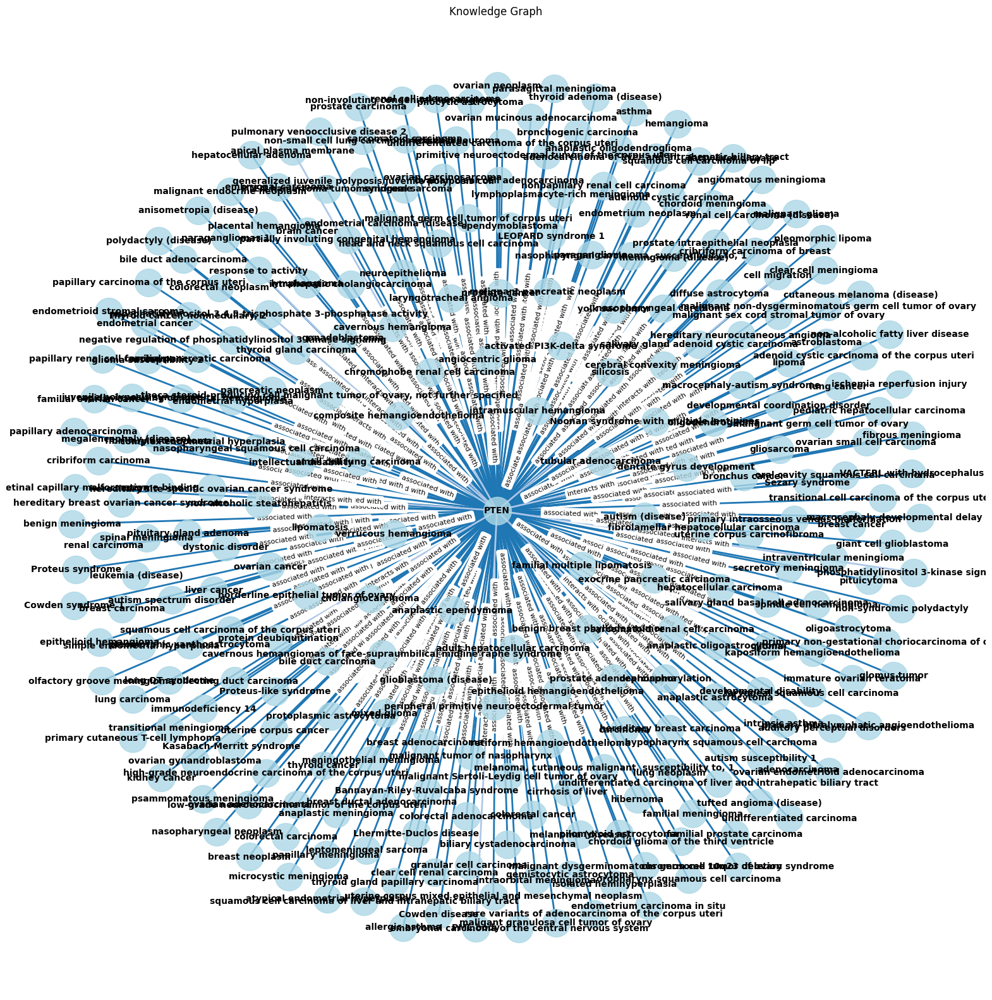

In [43]:
df = result[result['x_name']=='PTEN']
# Create a knowledge graph using NetworkX
G = nx.Graph()

# Add nodes (x_name and y_name)
for node in df['x_name'].unique():
    G.add_node(node, type='x_name')
for node in df['y_name'].unique():
    G.add_node(node, type='y_name')

# Add edges between x_name and y_name with their corresponding relation and display_relation as edge attributes
for _, row in df.iterrows():
    G.add_edge(row['x_name'], row['y_name'], relation=row['relation'], display_relation=row['display_relation'])

# Visualize the knowledge graph
pos = nx.spring_layout(G)  # Layout the nodes using spring algorithm
plt.figure(figsize=(20, 20))

# Define unique colors for each unique type of 'display_relation'
unique_display_relations = df['display_relation'].unique()
edge_colors = [plt.cm.tab20(i) for i in range(len(unique_display_relations))]

# Map each 'display_relation' to its corresponding color
display_relation_to_color = dict(zip(unique_display_relations, edge_colors))

# Draw edges with unique colors based on 'display_relation'
for edge in G.edges():
    display_relation = G.edges[edge]['display_relation']
    color = display_relation_to_color[display_relation]
    nx.draw_networkx_edges(G, pos, edgelist=[edge], edge_color=color, width=2.0)

# Draw nodes
nx.draw_networkx_nodes(G, pos, node_color='lightblue', node_size=1000, node_shape='o', alpha=0.8)

# Draw node labels
node_labels = {node: node for node in G.nodes()}
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=10, font_weight='bold')

# Add edge labels (display_relation)
edge_labels = {(edge[0], edge[1]): G.edges[edge]['display_relation'] for edge in G.edges()}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=8)

plt.title('Knowledge Graph')
plt.axis('off')
plt.show()

#Machine learning

In [44]:
result.columns

Index(['relation', 'display_relation', 'x_id', 'x_type', 'x_name', 'x_source',
       'y_id', 'y_type', 'y_name', 'y_source'],
      dtype='object')

In [45]:
data = result

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

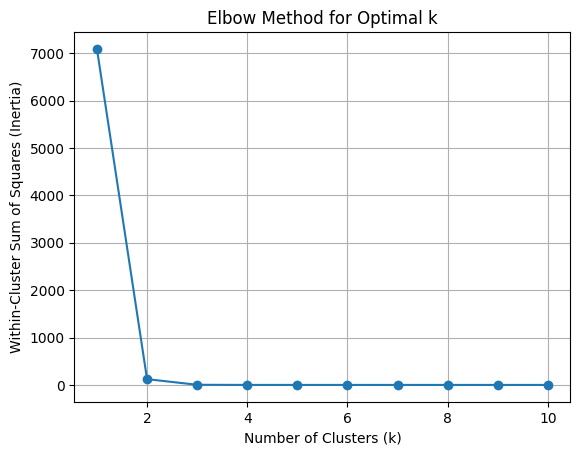

In [46]:

# Assuming you have the dataframe named 'data' as described in your question

# Separate features and labels
X = data.drop(columns=['y_name'])  # Drop the 'y_name' column as it's the target variable for clustering
y = data['y_name']

# Separate numerical and categorical features
#numerical_features = ['x_id', 'y_id']
categorical_features = ['relation', 'display_relation', 'x_type', 'x_name', 'x_source', 'y_type', 'y_source']

# Create pipelines for numerical and categorical features
#numerical_pipeline = Pipeline(steps=[('scaler', StandardScaler())])
categorical_pipeline = Pipeline(steps=[('onehot', OneHotEncoder())])

# Create a column transformer to handle different types of features
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_pipeline, categorical_features)
    ])

# Apply preprocessing to the features
X_preprocessed = preprocessor.fit_transform(X)

# Perform TruncatedSVD for feature selection
svd = TruncatedSVD(n_components=2)  # Choose the number of components (2 for visualization purposes)
X_svd = svd.fit_transform(X_preprocessed)

# Initialize a list to store the inertia values for different k
inertia_values = []

# Try different values of k (e.g., from 1 to 10)
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_svd)
    inertia_values.append(kmeans.inertia_)

# Plot the Elbow curve
plt.plot(range(1, 11), inertia_values, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (Inertia)')
plt.title('Elbow Method for Optimal k')
plt.grid(True)
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

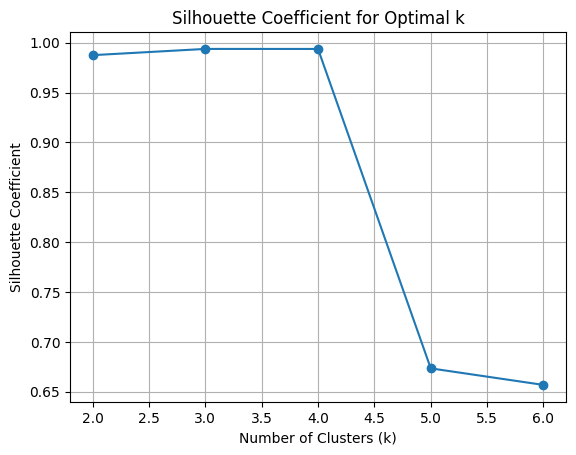

In [47]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder

# Assuming you have the dataframe named 'data' as described in your question
# ... (same code as before) ...

# Initialize a list to store the silhouette scores for different k
silhouette_scores = []

# Try different values of k (e.g., from 2 to 6)
for k in range(2, 7):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_svd)
    labels = kmeans.labels_
    silhouette_scores.append(silhouette_score(X_svd, labels))

# Plot the Silhouette Score
plt.plot(range(2, 7), silhouette_scores, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Coefficient')
plt.title('Silhouette Coefficient for Optimal k')
plt.grid(True)
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


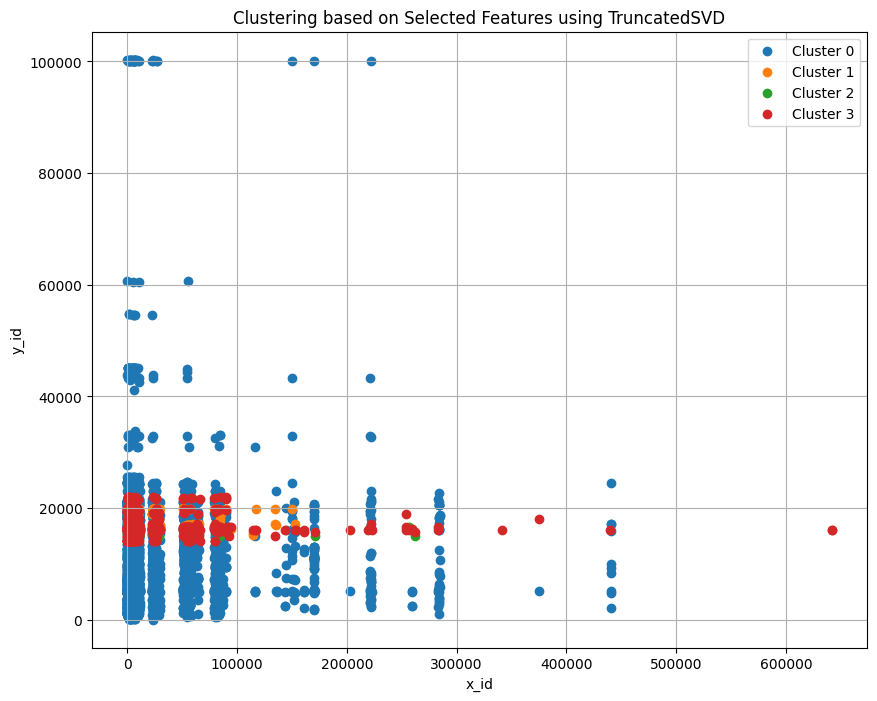

In [48]:
# Assuming you have the dataframe named 'data' as described in your question

# Convert 'x_id' and 'y_id' columns to numeric
data['x_id'] = pd.to_numeric(data['x_id'], errors='coerce')
data['y_id'] = pd.to_numeric(data['y_id'], errors='coerce')

# Separate features and labels
X = data.drop(columns=['y_name'])  # Drop the 'y_name' column as it's the target variable for clustering
y = data['y_name']

# Separate numerical and categorical features
# numerical_features = ['x_id', 'y_id']
categorical_features = ['relation', 'display_relation', 'x_type', 'x_name', 'x_source', 'y_type', 'y_source']

# Create pipelines for numerical and categorical features
categorical_pipeline = Pipeline(steps=[('onehot', OneHotEncoder())])

# Create a column transformer to handle different types of features
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_pipeline, categorical_features)
    ])

# Apply preprocessing to the features
X_preprocessed = preprocessor.fit_transform(X)

# Perform TruncatedSVD for feature selection
svd = TruncatedSVD(n_components=2)  # Choose the number of components (2 for visualization purposes)
X_svd = svd.fit_transform(X_preprocessed)

# Apply K-means clustering on the selected features
num_clusters = 4
# You can set the desired number of clusters
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(X_svd)

# Add the cluster labels back to the dataframe
data['cluster'] = clusters

# Visualize the clusters using a scatter plot
plt.figure(figsize=(10, 8))
for cluster_label in range(num_clusters):
    cluster_data = data[data['cluster'] == cluster_label]
    plt.scatter(cluster_data['x_id'], cluster_data['y_id'], label=f'Cluster {cluster_label}')
plt.xlabel('x_id')
plt.ylabel('y_id')
plt.title('Clustering based on Selected Features using TruncatedSVD')
plt.legend()
plt.grid(True)
plt.show()


In [49]:
data.to_csv('result.csv')

In [140]:
data['cluster'].value_counts()

0    8277
3     862
1     321
2      77
Name: cluster, dtype: int64

#Inferences for each Cluster

#Cluster 0

https://metascape.org/gp/index.html#/main/step1

In [84]:
cluster_0 = data[data['cluster']==0]
cluster_0['x_name']

0          ADK
1       ADORA1
2         JAG1
3         ANK3
4         APOE
         ...  
8272      NOS3
8273     HLA-B
8274     FGFR1
8275     OPRM1
8276     OPRM1
Name: x_name, Length: 8277, dtype: object

In [85]:
cluster_0['y_name'].unique()

array(['schizophrenia (disease)', 'Alzheimer disease',
       'Alzheimer disease type 1', ..., 'hypophosphatemia (disease)',
       'constipation disorder', 'orthostatic hypotension (disease)'],
      dtype=object)

In [88]:
cluster_0.head(10)
# Create a DataFrame from the data
df = cluster_0
# Create a knowledge graph using NetworkX
G = nx.Graph()

# Add nodes (genes/proteins and cellular components/biological processes)
G.add_nodes_from(df['x_name'].unique(), type='gene/protein')
G.add_nodes_from(df['y_name'].unique(), type='cellular_component_or_biological_process')

# Add edges between genes/proteins and cellular components/biological processes with their corresponding relation,
# display_relation, and source as edge attributes
for _, row in df.iterrows():
    G.add_edge(row['x_name'], row['y_name'], relation=row['relation'],
               display_relation=row['display_relation'], source=row['x_source'])

# Create a Plotly figure
fig = make_subplots(rows=1, cols=1)

# Create a list to store nodes with multiple edges
nodes_with_multiple_edges = []

# Increase spacing between nodes
pos = nx.spring_layout(G, seed=42, k=1)

# Create nodes and edges
for node in G.nodes():
    # Check if the node is present in the layout
    if node in pos:
        x, y = pos[node]

        # Check if the node has more than one edge
        if len(G.edges(node)) > 1:
            node_trace = go.Scatter(x=[x], y=[y], mode='markers+text', marker=dict(size=20, color='red'),
                                    text=node, hoverinfo='text', textposition='bottom center')
            nodes_with_multiple_edges.append(node)
        else:
            node_trace = go.Scatter(x=[x], y=[y], mode='markers+text', marker=dict(size=20, color='lightblue'),
                                    text=node, hoverinfo='text', textposition='bottom center')

        fig.add_trace(node_trace)

for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_trace = go.Scatter(x=[x0, x1, None], y=[y0, y1, None], line=dict(width=0.5, color='gray'), mode='lines',
                            hoverinfo='none')
    fig.add_trace(edge_trace)

# Add edge labels (display_relation and source)
edge_labels = {edge: f"{G.edges[edge]['display_relation']} ({G.edges[edge]['source']})" for edge in G.edges()}
for edge, label in edge_labels.items():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    label_trace = go.Scatter(x=[x0, x1], y=[y0, y1], mode='text', hoverinfo='text', text=[label],
                             textposition='middle center', textfont=dict(size=10))
    fig.add_trace(label_trace)

# Set the layout properties
fig.update_layout(showlegend=False, title_text='Knowledge Graph for Gene-Protein Interaction', title_font=dict(size=14),
                  hovermode='closest', hoverlabel=dict(bgcolor='white', font_size=10, font_family='Arial'))

# Set axis properties to hide gridlines and tick labels
fig.update_xaxes(showgrid=False, showticklabels=False)
fig.update_yaxes(showgrid=False, showticklabels=False)

# Set the figure size
fig.update_layout(width=1800, height=1600)

# Show the interactive knowledge graph
fig.show()

In [89]:
pio.write_image(fig, 'knowledge_graph_cluster0.jpg', format='jpg')

#Cluster 1

In [90]:
cluster_1 = data[data['cluster']==1]
cluster_1.head(10)

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source,cluster
10701,molfunc_protein,interacts with,463,gene/protein,ZFHX3,NCBI,19899,molecular_function,enzyme binding,GO,1
10702,molfunc_protein,interacts with,595,gene/protein,CCND1,NCBI,19899,molecular_function,enzyme binding,GO,1
10703,molfunc_protein,interacts with,857,gene/protein,CAV1,NCBI,19899,molecular_function,enzyme binding,GO,1
10704,molfunc_protein,interacts with,1544,gene/protein,CYP1A2,NCBI,19899,molecular_function,enzyme binding,GO,1
10705,molfunc_protein,interacts with,1557,gene/protein,CYP2C19,NCBI,19899,molecular_function,enzyme binding,GO,1
10706,molfunc_protein,interacts with,1655,gene/protein,DDX5,NCBI,19899,molecular_function,enzyme binding,GO,1
10707,molfunc_protein,interacts with,1785,gene/protein,DNM2,NCBI,19899,molecular_function,enzyme binding,GO,1
10708,molfunc_protein,interacts with,1855,gene/protein,DVL1,NCBI,19899,molecular_function,enzyme binding,GO,1
10709,molfunc_protein,interacts with,2099,gene/protein,ESR1,NCBI,19899,molecular_function,enzyme binding,GO,1
10710,molfunc_protein,interacts with,2335,gene/protein,FN1,NCBI,19899,molecular_function,enzyme binding,GO,1


In [91]:
cluster_1['y_name'].unique()

array(['enzyme binding', 'growth factor binding', 'deacetylase activity',
       'hydrolase activity', 'amino acid binding', 'cholesterol binding',
       'syntaxin binding', 'ATPase', 'kinase activity',
       'SH3 domain binding', 'palmitoyl-CoA oxidase activity',
       'phosphatase activity', 'myosin binding', 'protein kinase binding',
       'kinesin binding', 'nuclear receptor binding', 'vinculin binding',
       'protein domain specific binding', 'peptide hormone binding',
       'coreceptor activity', 'potassium channel regulator activity',
       'TBP-class protein binding', 'antioxidant activity',
       'oxygen binding', 'tubulin binding', 'heme binding',
       'calcium channel inhibitor activity',
       'protein phosphatase binding', 'ligand-gated ion channel activity',
       'oxidoreductase activity', 'protein kinase regulator activity',
       'transferase activity', 'water channel activity',
       'phospholipase activator activity', 'peptidase activator activity',
  

In [92]:
cluster_1[cluster_1['x_name']=='DAG1']['y_name']

10828    vinculin binding
10855     tubulin binding
Name: y_name, dtype: object

In [94]:

# Create a DataFrame from the data
df = cluster_1
# Create a knowledge graph using NetworkX
G = nx.Graph()

# Add nodes (genes/proteins and cellular components/biological processes)
G.add_nodes_from(df['x_name'].unique(), type='gene/protein')
G.add_nodes_from(df['y_name'].unique(), type='cellular_component_or_biological_process')

# Add edges between genes/proteins and cellular components/biological processes with their corresponding relation,
# display_relation, and source as edge attributes
for _, row in df.iterrows():
    G.add_edge(row['x_name'], row['y_name'], relation=row['relation'],
               display_relation=row['display_relation'], source=row['x_source'])

# Create a Plotly figure
fig = make_subplots(rows=1, cols=1)

# Create a list to store nodes with multiple edges
nodes_with_multiple_edges = []

# Increase spacing between nodes
pos = nx.spring_layout(G, seed=42, k=1)

# Create nodes and edges
for node in G.nodes():
    # Check if the node is present in the layout
    if node in pos:
        x, y = pos[node]

        # Check if the node has more than one edge
        if len(G.edges(node)) > 1:
            node_trace = go.Scatter(x=[x], y=[y], mode='markers+text', marker=dict(size=20, color='red'),
                                    text=node, hoverinfo='text', textposition='bottom center')
            nodes_with_multiple_edges.append(node)
        else:
            node_trace = go.Scatter(x=[x], y=[y], mode='markers+text', marker=dict(size=20, color='lightblue'),
                                    text=node, hoverinfo='text', textposition='bottom center')

        fig.add_trace(node_trace)

for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_trace = go.Scatter(x=[x0, x1, None], y=[y0, y1, None], line=dict(width=0.5, color='gray'), mode='lines',
                            hoverinfo='none')
    fig.add_trace(edge_trace)

# Add edge labels (display_relation and source)
edge_labels = {edge: f"{G.edges[edge]['display_relation']} ({G.edges[edge]['source']})" for edge in G.edges()}
for edge, label in edge_labels.items():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    label_trace = go.Scatter(x=[x0, x1], y=[y0, y1], mode='text', hoverinfo='text', text=[label],
                             textposition='middle center', textfont=dict(size=10))
    fig.add_trace(label_trace)

# Set the layout properties
fig.update_layout(showlegend=False, title_text='Knowledge Graph for Gene-Protein Interaction', title_font=dict(size=14),
                  hovermode='closest', hoverlabel=dict(bgcolor='white', font_size=10, font_family='Arial'))

# Set axis properties to hide gridlines and tick labels
fig.update_xaxes(showgrid=False, showticklabels=False)
fig.update_yaxes(showgrid=False, showticklabels=False)

# Set the figure size
fig.update_layout(width=1800, height=1600)

# Show the interactive knowledge graph
fig.show()

In [102]:
pio.write_image(fig, 'knowledge_graph_cluster1.jpg', format='jpg')

#Cluster 2

In [103]:
cluster_2 = data[data['cluster']==2]
cluster_2.head(10)

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source,cluster
11884,anatomy_protein_present,expression present,1373,gene/protein,CPS1,NCBI,14892,anatomy,skeletal muscle organ,UBERON,2
11885,anatomy_protein_present,expression present,9497,gene/protein,SLC4A7,NCBI,14892,anatomy,skeletal muscle organ,UBERON,2
11886,anatomy_protein_present,expression present,7414,gene/protein,VCL,NCBI,14892,anatomy,skeletal muscle organ,UBERON,2
11887,anatomy_protein_present,expression present,51773,gene/protein,RSF1,NCBI,14892,anatomy,skeletal muscle organ,UBERON,2
11888,anatomy_protein_present,expression present,816,gene/protein,CAMK2B,NCBI,16525,anatomy,frontal lobe,UBERON,2
11889,anatomy_protein_present,expression present,28996,gene/protein,HIPK2,NCBI,14892,anatomy,skeletal muscle organ,UBERON,2
11890,anatomy_protein_present,expression present,53339,gene/protein,BTBD1,NCBI,14892,anatomy,skeletal muscle organ,UBERON,2
11891,anatomy_protein_present,expression present,5586,gene/protein,PKN2,NCBI,14892,anatomy,skeletal muscle organ,UBERON,2
11892,anatomy_protein_present,expression present,6857,gene/protein,SYT1,NCBI,16525,anatomy,frontal lobe,UBERON,2
11893,anatomy_protein_present,expression present,5217,gene/protein,PFN2,NCBI,14892,anatomy,skeletal muscle organ,UBERON,2


In [104]:
cluster_2['y_name'].unique()

array(['skeletal muscle organ', 'frontal lobe'], dtype=object)

In [105]:
cluster_0.head(10)
# Create a DataFrame from the data
df = cluster_2
# Create a knowledge graph using NetworkX
G = nx.Graph()

# Add nodes (genes/proteins and cellular components/biological processes)
G.add_nodes_from(df['x_name'].unique(), type='gene/protein')
G.add_nodes_from(df['y_name'].unique(), type='cellular_component_or_biological_process')

# Add edges between genes/proteins and cellular components/biological processes with their corresponding relation,
# display_relation, and source as edge attributes
for _, row in df.iterrows():
    G.add_edge(row['x_name'], row['y_name'], relation=row['relation'],
               display_relation=row['display_relation'], source=row['x_source'])

# Create a Plotly figure
fig = make_subplots(rows=1, cols=1)

# Create a list to store nodes with multiple edges
nodes_with_multiple_edges = []

# Increase spacing between nodes
pos = nx.spring_layout(G, seed=42, k=1)

# Create nodes and edges
for node in G.nodes():
    # Check if the node is present in the layout
    if node in pos:
        x, y = pos[node]

        # Check if the node has more than one edge
        if len(G.edges(node)) > 1:
            node_trace = go.Scatter(x=[x], y=[y], mode='markers+text', marker=dict(size=20, color='red'),
                                    text=node, hoverinfo='text', textposition='bottom center')
            nodes_with_multiple_edges.append(node)
        else:
            node_trace = go.Scatter(x=[x], y=[y], mode='markers+text', marker=dict(size=20, color='lightblue'),
                                    text=node, hoverinfo='text', textposition='bottom center')

        fig.add_trace(node_trace)

for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_trace = go.Scatter(x=[x0, x1, None], y=[y0, y1, None], line=dict(width=0.5, color='gray'), mode='lines',
                            hoverinfo='none')
    fig.add_trace(edge_trace)

# Add edge labels (display_relation and source)
edge_labels = {edge: f"{G.edges[edge]['display_relation']} ({G.edges[edge]['source']})" for edge in G.edges()}
for edge, label in edge_labels.items():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    label_trace = go.Scatter(x=[x0, x1], y=[y0, y1], mode='text', hoverinfo='text', text=[label],
                             textposition='middle center', textfont=dict(size=10))
    fig.add_trace(label_trace)

# Set the layout properties
fig.update_layout(showlegend=False, title_text='Knowledge Graph for Gene-Protein Interaction', title_font=dict(size=14),
                  hovermode='closest', hoverlabel=dict(bgcolor='white', font_size=10, font_family='Arial'))

# Set axis properties to hide gridlines and tick labels
fig.update_xaxes(showgrid=False, showticklabels=False)
fig.update_yaxes(showgrid=False, showticklabels=False)

# Set the figure size
fig.update_layout(width=1800, height=1600)

# Show the interactive knowledge graph
fig.show()

In [106]:
pio.write_image(fig, 'knowledge_graph_cluster2.jpg', format='jpg')

#Cluster 3

In [107]:
cluster_3 = data[data['cluster']==3]
cluster_3.head(10)

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source,cluster
11022,cellcomp_protein,interacts with,109,gene/protein,ADCY3,NCBI,16021,cellular_component,integral component of membrane,GO,3
11023,cellcomp_protein,interacts with,111,gene/protein,ADCY5,NCBI,16021,cellular_component,integral component of membrane,GO,3
11024,cellcomp_protein,interacts with,115,gene/protein,ADCY9,NCBI,16021,cellular_component,integral component of membrane,GO,3
11025,cellcomp_protein,interacts with,358,gene/protein,AQP1,NCBI,16021,cellular_component,integral component of membrane,GO,3
11026,cellcomp_protein,interacts with,775,gene/protein,CACNA1C,NCBI,16021,cellular_component,integral component of membrane,GO,3
11027,cellcomp_protein,interacts with,887,gene/protein,CCKBR,NCBI,16021,cellular_component,integral component of membrane,GO,3
11028,cellcomp_protein,interacts with,987,gene/protein,LRBA,NCBI,16021,cellular_component,integral component of membrane,GO,3
11029,cellcomp_protein,interacts with,1129,gene/protein,CHRM2,NCBI,16021,cellular_component,integral component of membrane,GO,3
11030,cellcomp_protein,interacts with,1306,gene/protein,COL15A1,NCBI,16021,cellular_component,integral component of membrane,GO,3
11031,cellcomp_protein,interacts with,1605,gene/protein,DAG1,NCBI,16021,cellular_component,integral component of membrane,GO,3


In [108]:
cluster_3['y_name'].unique()

array(['integral component of membrane', 'microtubule cytoskeleton',
       'membrane', 'basolateral plasma membrane', 'nuclear body',
       'actin cytoskeleton', 'SWI/SNF complex', 'postsynaptic density',
       'apical plasma membrane', 'sarcoplasmic reticulum',
       'nuclear speck', 'nuclear matrix',
       'extrinsic component of membrane',
       'spectrin-associated cytoskeleton', 'intercalated disc',
       'lateral plasma membrane',
       'extrinsic component of plasma membrane', 'catenin complex',
       'symbiont-containing vacuole membrane',
       'symbiont-containing vacuole', 'PML body',
       'vacuolar proton-transporting V-type ATPase complex',
       'transcription repressor complex',
       'junctional sarcoplasmic reticulum membrane',
       'dystrophin-associated glycoprotein complex', 'mediator complex',
       'SCF ubiquitin ligase complex', 'Golgi transport complex',
       'apicolateral plasma membrane', 'Cajal body',
       'dystroglycan complex', 'RISC co

In [109]:
# Create a DataFrame from the data
df = cluster_3
# Create a knowledge graph using NetworkX
G = nx.Graph()

# Add nodes (genes/proteins and cellular components/biological processes)
G.add_nodes_from(df['x_name'].unique(), type='gene/protein')
G.add_nodes_from(df['y_name'].unique(), type='cellular_component_or_biological_process')

# Add edges between genes/proteins and cellular components/biological processes with their corresponding relation,
# display_relation, and source as edge attributes
for _, row in df.iterrows():
    G.add_edge(row['x_name'], row['y_name'], relation=row['relation'],
               display_relation=row['display_relation'], source=row['x_source'])

# Create a Plotly figure
fig = make_subplots(rows=1, cols=1)

# Create a list to store nodes with multiple edges
nodes_with_multiple_edges = []

# Increase spacing between nodes
pos = nx.spring_layout(G, seed=42, k=1)

# Create nodes and edges
for node in G.nodes():
    # Check if the node is present in the layout
    if node in pos:
        x, y = pos[node]

        # Check if the node has more than one edge
        if len(G.edges(node)) > 1:
            node_trace = go.Scatter(x=[x], y=[y], mode='markers+text', marker=dict(size=20, color='red'),
                                    text=node, hoverinfo='text', textposition='bottom center')
            nodes_with_multiple_edges.append(node)
        else:
            node_trace = go.Scatter(x=[x], y=[y], mode='markers+text', marker=dict(size=20, color='lightblue'),
                                    text=node, hoverinfo='text', textposition='bottom center')

        fig.add_trace(node_trace)

for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_trace = go.Scatter(x=[x0, x1, None], y=[y0, y1, None], line=dict(width=0.5, color='gray'), mode='lines',
                            hoverinfo='none')
    fig.add_trace(edge_trace)

# Add edge labels (display_relation and source)
edge_labels = {edge: f"{G.edges[edge]['display_relation']} ({G.edges[edge]['source']})" for edge in G.edges()}
for edge, label in edge_labels.items():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    label_trace = go.Scatter(x=[x0, x1], y=[y0, y1], mode='text', hoverinfo='text', text=[label],
                             textposition='middle center', textfont=dict(size=10))
    fig.add_trace(label_trace)

# Set the layout properties
fig.update_layout(showlegend=False, title_text='Knowledge Graph for Gene-Protein Interaction', title_font=dict(size=14),
                  hovermode='closest', hoverlabel=dict(bgcolor='white', font_size=10, font_family='Arial'))

# Set axis properties to hide gridlines and tick labels
fig.update_xaxes(showgrid=False, showticklabels=False)
fig.update_yaxes(showgrid=False, showticklabels=False)

# Set the figure size
fig.update_layout(width=1800, height=1600)

# Show the interactive knowledge graph
fig.show()

In [110]:
pio.write_image(fig, 'knowledge_graph_cluster3.jpg', format='jpg')

#Genetic inferences of each cluster

In [116]:
# Assuming you have cluster_0, cluster_1, cluster_2, and cluster_3 DataFrames

# Extract 'x_name' columns from each DataFrame
x_names_0 = cluster_0['x_name']
x_names_1 = cluster_1['x_name']
x_names_2 = cluster_2['x_name']
x_names_3 = cluster_3['x_name']

# Combine x_name columns into a single DataFrame
combined_data = pd.DataFrame({
    'cluster_0_x_name': x_names_0,
    'cluster_1_x_name': x_names_1,
    'cluster_2_x_name': x_names_2,
    'cluster_3_x_name': x_names_3
})

# Display the first few rows of the combined DataFrame
combined_data.to_csv('Combined Cluster.csv')



#Analysing More Genetic connections

In [111]:
kg.head(10)

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source
29,protein_protein,ppi,2147,gene/protein,F2,NCBI,6696,gene/protein,SPP1,NCBI
68,protein_protein,ppi,10291,gene/protein,SF3A1,NCBI,29093,gene/protein,MRPL22,NCBI
122,protein_protein,ppi,358,gene/protein,AQP1,NCBI,157556,gene/protein,BAALC-AS2,NCBI
150,protein_protein,ppi,4088,gene/protein,SMAD3,NCBI,5515,gene/protein,PPP2CA,NCBI
169,protein_protein,ppi,7514,gene/protein,XPO1,NCBI,10413,gene/protein,YAP1,NCBI
172,protein_protein,ppi,7329,gene/protein,UBE2I,NCBI,64755,gene/protein,RUSF1,NCBI
178,protein_protein,ppi,7329,gene/protein,UBE2I,NCBI,8575,gene/protein,PRKRA,NCBI
179,protein_protein,ppi,1295,gene/protein,COL8A1,NCBI,4856,gene/protein,CCN3,NCBI
187,protein_protein,ppi,5728,gene/protein,PTEN,NCBI,7804,gene/protein,LRP8,NCBI
225,protein_protein,ppi,4878,gene/protein,NPPA,NCBI,23203,gene/protein,PMPCA,NCBI


In [112]:
cluster_3.head(10)

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source,cluster
11022,cellcomp_protein,interacts with,109,gene/protein,ADCY3,NCBI,16021,cellular_component,integral component of membrane,GO,3
11023,cellcomp_protein,interacts with,111,gene/protein,ADCY5,NCBI,16021,cellular_component,integral component of membrane,GO,3
11024,cellcomp_protein,interacts with,115,gene/protein,ADCY9,NCBI,16021,cellular_component,integral component of membrane,GO,3
11025,cellcomp_protein,interacts with,358,gene/protein,AQP1,NCBI,16021,cellular_component,integral component of membrane,GO,3
11026,cellcomp_protein,interacts with,775,gene/protein,CACNA1C,NCBI,16021,cellular_component,integral component of membrane,GO,3
11027,cellcomp_protein,interacts with,887,gene/protein,CCKBR,NCBI,16021,cellular_component,integral component of membrane,GO,3
11028,cellcomp_protein,interacts with,987,gene/protein,LRBA,NCBI,16021,cellular_component,integral component of membrane,GO,3
11029,cellcomp_protein,interacts with,1129,gene/protein,CHRM2,NCBI,16021,cellular_component,integral component of membrane,GO,3
11030,cellcomp_protein,interacts with,1306,gene/protein,COL15A1,NCBI,16021,cellular_component,integral component of membrane,GO,3
11031,cellcomp_protein,interacts with,1605,gene/protein,DAG1,NCBI,16021,cellular_component,integral component of membrane,GO,3


In [113]:
Kg_cluster3= kg[kg['x_name'].isin(cluster_3['x_name'].tolist())]
# Concatenate the dataframes vertically
Kg_cluster3= pd.concat([Kg_cluster3, cluster_3], ignore_index=True)
# Step 5: Print the entire dataset2 with the queried genes from gene1
Kg_cluster3.head(10)

,relation,display_relation,x_id,x_type,x_name,x_source,y_id,y_type,y_name,y_source,cluster
0,protein_protein,ppi,2147,gene/protein,F2,NCBI,6696,gene/protein,SPP1,NCBI,NaN
1,protein_protein,ppi,10291,gene/protein,SF3A1,NCBI,29093,gene/protein,MRPL22,NCBI,NaN
2,protein_protein,ppi,358,gene/protein,AQP1,NCBI,157556,gene/protein,BAALC-AS2,NCBI,NaN
3,protein_protein,ppi,4088,gene/protein,SMAD3,NCBI,5515,gene/protein,PPP2CA,NCBI,NaN
4,protein_protein,ppi,7514,gene/protein,XPO1,NCBI,10413,gene/protein,YAP1,NCBI,NaN
5,protein_protein,ppi,7329,gene/protein,UBE2I,NCBI,64755,gene/protein,RUSF1,NCBI,NaN
6,protein_protein,ppi,7329,gene/protein,UBE2I,NCBI,8575,gene/protein,PRKRA,NCBI,NaN
7,protein_protein,ppi,5728,gene/protein,PTEN,NCBI,7804,gene/protein,LRP8,NCBI,NaN
8,protein_protein,ppi,4878,gene/protein,NPPA,NCBI,23203,gene/protein,PMPCA,NCBI,NaN
9,protein_protein,ppi,1783,gene/protein,DYNC1LI2,NCBI,51143,gene/protein,DYNC1LI1,NCBI,NaN


In [114]:
# Calculate the value counts of 'x_name'
x_name = Kg_cluster3['x_name'].value_counts()
x_name

GATA2      1596
ESR1       1273
YY1         836
FN1         794
FYN         791
           ... 
CHST9        48
SLC14A2      37
OR51E1       32
MALRD1       27
OR5D14       10
Name: x_name, Length: 425, dtype: int64

In [119]:
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx

# Assuming you have the DataFrame 'Kg_cluster3' as described in your question
df = Kg_cluster3[Kg_cluster3['x_name'] == 'GNAS']
df['y_type'].unique()

array(['gene/protein', 'effect/phenotype', 'disease',
       'molecular_function', 'cellular_component', 'biological_process',
       'pathway', 'anatomy'], dtype=object)

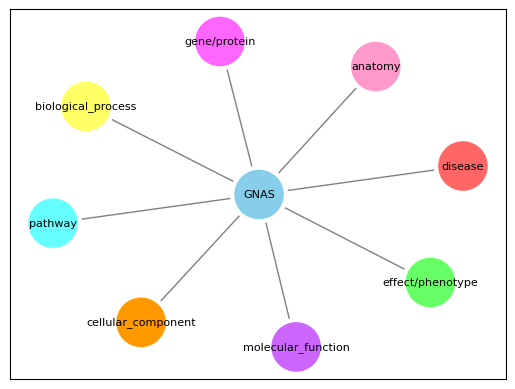

In [139]:
import matplotlib.pyplot as plt
import networkx as nx

# Create a DataFrame from the data
df = Kg_cluster3[Kg_cluster3['x_name'] == 'GNAS']

# Create a knowledge graph using NetworkX
G = nx.Graph()

# Add nodes (genes/proteins and other types)
G.add_node('GNAS', type='gene/protein', color='skyblue')  # Add the starting gene/protein node

# Iterate through unique y_types and assign colors
unique_y_types = df['y_type'].unique()
color_mapping = {
    'gene/protein': '#FF66FF',  # Magenta
    'effect/phenotype': '#66FF66',  # Green
    'disease': '#FF6666',  # Red
    'molecular_function': '#CC66FF',  # Purple
    'cellular_component': '#FF9900',  # Orange
    'biological_process': '#FFFF66',  # Yellow
    'pathway': '#66FFFF',  # Cyan
    'anatomy': '#FF99CC'  # Pink
}

for y_type in unique_y_types:
    G.add_node(y_type, type=y_type, color=color_mapping.get(y_type, 'gray'))

# Add edges between the starting gene/protein node and other y_type nodes
for y_type in unique_y_types:
    G.add_edge('GNAS', y_type)

# Set positions for nodes
pos = nx.spring_layout(G)

# Draw nodes with different colors based on 'color' attribute
node_colors = [G.nodes[node]['color'] for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_size=1500, node_color=node_colors, edgecolors='white', linewidths=3)

# Draw edges
nx.draw_networkx_edges(G, pos, edge_color='gray')

# Draw node labels with more prominent styling
node_labels = {node: f"{node}" for node in G.nodes()}
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8)

# Set the plot title
#plt.title('Knowledge Graph for Gene GNAS with Distinguished y_type Sections')

# Display the plot
plt.show()


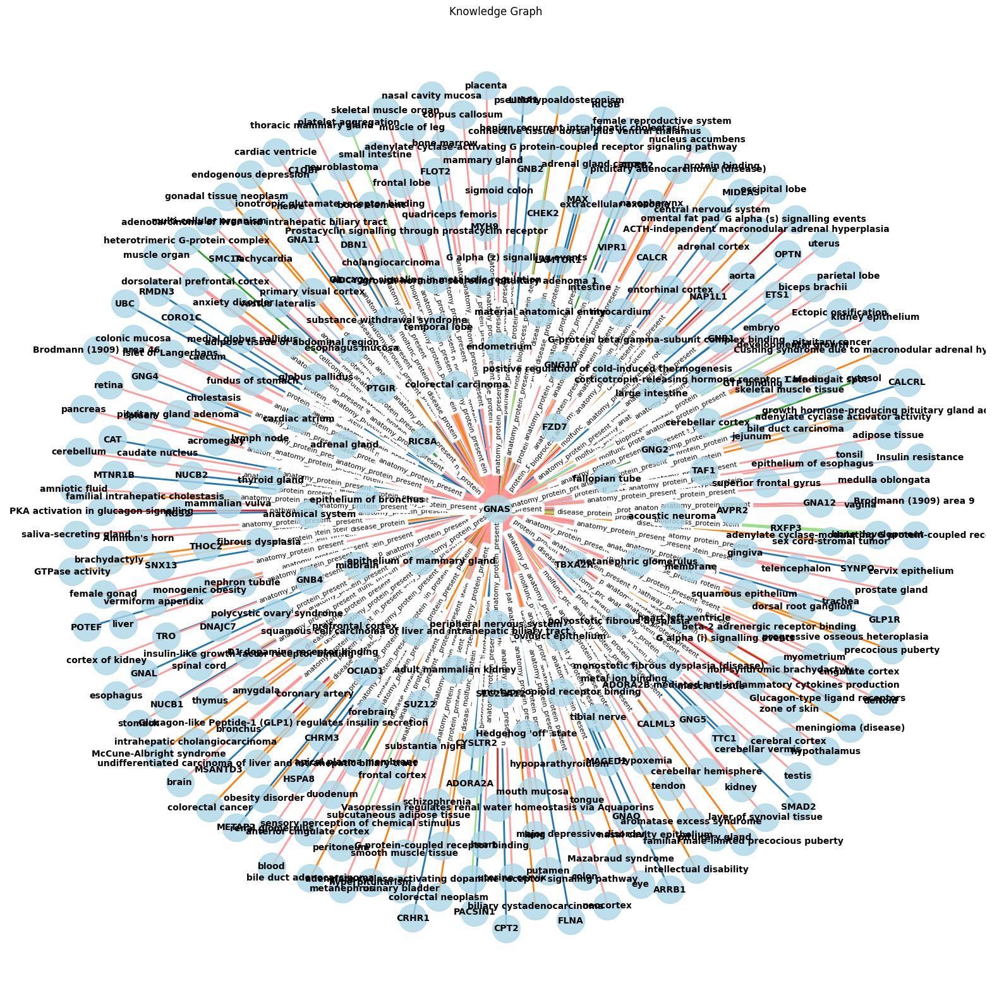

In [121]:


# Create a knowledge graph using NetworkX
G = nx.Graph()

# Create a dictionary to store nodes by relation
nodes_by_relation = {}

# Add nodes (x_name and y_name) and group by relation
for _, row in df.iterrows():
    x_node = row['x_name']
    y_node = row['y_name']
    relation = row['relation']
    display_relation = row['display_relation']

    if relation not in nodes_by_relation:
        nodes_by_relation[relation] = {'x': set(), 'y': set()}

    nodes_by_relation[relation]['x'].add(x_node)
    nodes_by_relation[relation]['y'].add(y_node)

# Add nodes and edges for each relation
for relation, nodes in nodes_by_relation.items():
    for node in nodes['x']:
        G.add_node(node, type='x_name', relation=relation)
    for node in nodes['y']:
        G.add_node(node, type='y_name', relation=relation)
    for edge in nodes['x'].union(nodes['y']):
        G.add_edge(list(nodes['x'])[0], edge, relation=relation)

# Visualize the knowledge graph
pos = nx.spring_layout(G)  # Layout the nodes using spring algorithm
plt.figure(figsize=(20, 20))

# Define unique colors for each unique type of 'relation'
unique_relations = list(nodes_by_relation.keys())
edge_colors = [plt.cm.tab20(i) for i in range(len(unique_relations))]

# Map each 'relation' to its corresponding color
relation_to_color = dict(zip(unique_relations, edge_colors))

# Draw edges with unique colors based on 'relation'
for edge in G.edges():
    relation = G.edges[edge]['relation']
    color = relation_to_color[relation]
    nx.draw_networkx_edges(G, pos, edgelist=[edge], edge_color=color, width=2.0)

# Draw nodes
nx.draw_networkx_nodes(G, pos, node_color='lightblue', node_size=1000, node_shape='o', alpha=0.8)

# Draw node labels
node_labels = {node: node for node in G.nodes()}
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=10, font_weight='bold')

# Add edge labels (relation)
edge_labels = {(edge[0], edge[1]): G.edges[edge]['relation'] for edge in G.edges()}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=8)

plt.title('Knowledge Graph')
plt.axis('off')
plt.show()
